In [1]:
import numpy as np
import pandas as pd
import os
import tqdm

In [2]:
dat1 = np.load("gathered_k_runs.pkl", allow_pickle=True)
dat2 = np.load("gathered_data.pkl", allow_pickle=True)
combined_df = pd.concat([dat1, dat2], ignore_index=True)
combined_df.to_pickle("final.pkl")  

In [3]:
folder = "data/processed/"
focus = "all"

def gather_data(folder, focus):
    data_loc = folder + focus
    files = os.listdir(data_loc)
    files = filter(lambda x: (len(x) > 4) and (".csv" == x[-4:]), files)
    files = map(lambda x: data_loc + '/' + x, files)
    files = map(pd.read_csv, files)
    return pd.concat(files).reset_index(drop = True)

#df_data = gather_data(folder, focus)
df_data = np.load("final.pkl", allow_pickle=True)

In [12]:
df_data.describe()


,c,k,n,p,zeta,analytical_sigma_cont,kuramoto_euler_sigma_squared_all,kuramoto_euler_sigma_squared_1000,kuramoto_euler_sigma_squared_100,kuramoto_euler_sigma_squared_10,ou_euler_sigma_squared_all,ou_euler_sigma_squared_1000,ou_euler_sigma_squared_100,ou_euler_sigma_squared_10
count,374400.000000,374400.000000,374400.0,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000,374400.000000
mean,0.450000,7.076923,100.0,0.203267,0.275000,0.278378,0.750641,0.770965,0.782827,0.784598,0.283025,0.282168,0.280857,0.280839
std,0.229129,2.211681,0.0,0.259122,0.114565,0.415842,0.910454,0.926289,0.947436,0.956679,0.430923,0.436904,0.447874,0.453243
min,0.100000,4.000000,100.0,0.007000,0.100000,0.006397,0.006438,0.006372,0.006119,0.005390,0.006398,0.006334,0.006084,0.005357
25%,0.275000,6.000000,100.0,0.019000,0.187500,0.058938,0.083761,0.084024,0.083190,0.082040,0.059470,0.059364,0.058640,0.057622
50%,0.450000,8.000000,100.0,0.078000,0.275000,0.145383,0.259091,0.264068,0.261461,0.256372,0.147220,0.146685,0.144263,0.141760
75%,0.625000,10.000000,100.0,0.317000,0.362500,0.318732,1.291430,1.377456,1.384310,1.371524,0.322710,0.320819,0.314617,0.310853
max,0.800000,10.000000,100.0,0.905000,0.450000,6.829102,3.181052,3.185211,3.240159,3.522882,13.274520,13.132776,17.739839,16.284444


In [5]:
id_col = ("p", "zeta", "c", "k")
df_data_clean = pd.DataFrame(index = df_data.index)
for i in id_col:
    df_data_clean[i] = df_data[i]
df_data_clean["analytical_sigma_continuous"] = df_data["analytical_sigma_cont"]
df_data_clean["kuramoto_sigma_squared"] = df_data["kuramoto_euler_sigma_squared_all"]
df_data_clean["linear_sigma_squared"] = df_data["ou_euler_sigma_squared_all"]

In [6]:
REL_ERR = lambda df, Measured_Label, True_Label: abs(df[Measured_Label] - df[True_Label]) / df[True_Label]

id_col = ("p", "zeta", "c")

def proc_data(df_data, id_col):

    err_data = pd.DataFrame(index=df_data.index)

    for label in id_col:
        err_data[label] = df_data[label]
    err_data["sigma_relative_error_continuous"] = REL_ERR(df_data, "analytical_sigma_continuous", "linear_sigma_squared")
    err_data["empirical_relative_error_linear_kuramoto"] = REL_ERR(df_data, "linear_sigma_squared", "kuramoto_sigma_squared")
    err_data["sigma_relative_error_continuous_kuramoto"] = REL_ERR(df_data, "analytical_sigma_continuous", "kuramoto_sigma_squared")
    err_data["sigma_continuous_analytic_real"] = df_data["analytical_sigma_continuous"]
    err_data["sigma_continuous_kuramoto_real"] = df_data["kuramoto_sigma_squared"]


    err_data_mean = err_data.groupby(list(id_col)).mean()
    err_data_names = err_data_mean.columns
    err_data_mean = err_data_mean.reset_index(drop = False)
    return err_data_mean, err_data

err_data_mean, err_data = proc_data(df_data_clean, id_col)

In [7]:
display(err_data_mean.describe())
display(err_data_mean.head())

,p,zeta,c,sigma_relative_error_continuous,empirical_relative_error_linear_kuramoto,sigma_relative_error_continuous_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
count,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000
mean,0.203267,0.275000,0.450000,0.027460,0.320671,0.327491,0.278378,0.750641
std,0.259257,0.114624,0.229248,0.026204,0.215185,0.217037,0.382122,0.752316
min,0.007000,0.100000,0.100000,0.003846,0.006217,0.010559,0.006634,0.006707
25%,0.019000,0.187500,0.275000,0.006125,0.112638,0.116644,0.061035,0.136331
50%,0.078000,0.275000,0.450000,0.016218,0.322284,0.330434,0.152505,0.485790
75%,0.317000,0.362500,0.625000,0.044148,0.522523,0.530776,0.329862,1.193158
max,0.905000,0.450000,0.800000,0.130895,0.765719,0.766264,3.193867,2.821479


,p,zeta,c,sigma_relative_error_continuous,empirical_relative_error_linear_kuramoto,sigma_relative_error_continuous_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
0,0.007,0.1,0.1,0.125539,0.589210,0.611600,0.156184,1.408193
1,0.007,0.1,0.2,0.089330,0.559497,0.587232,0.078370,1.387614
2,0.007,0.1,0.3,0.074856,0.609209,0.631444,0.052205,1.512223
3,0.007,0.1,0.4,0.068890,0.572127,0.595934,0.038947,1.383001
4,0.007,0.1,0.5,0.061836,0.652555,0.671499,0.031413,1.590471


In [8]:
import matplotlib.pyplot as plt

#df should be prepivoted and filtered
def graph_diff(df, plt_name, splt_name_func, err_data_names, min_max = None, nfi = None, col_ind = ("x", "y"), size = (2, 2)):
    err_data_names = df.columns
    fig, axes = plt.subplots(nrows=size[0], ncols=size[1])
    fig.suptitle(plt_name)
    
    fig.set_size_inches(20, 10)
    fig.subplots_adjust(top=0.95)
    
    if min_max is None and nfi is not None:
        cmax = df[nfi.keys()].max().max()
        cmin = df[nfi.keys()].min().min()
    else:
        cmax = min_max[1]
        cmin = min_max[0]

    for name_index in range(len(axes.flat)):
        if name_index >= len(err_data_names):
            ax = axes.flat[name_index]
            ax.axis('off')
            continue
        if nfi is not None:
            if name_index >= len(nfi):
                ax = axes.flat[name_index]
                ax.axis('off')            
                continue
            name = list(nfi.keys())[name_index]
        else:
            name = list(err_data_names)[name_index]
        df_p = df[name]
        #display(df_p)
        np_a = df_p.to_numpy()
        ax = axes.flat[name_index]

        x_t = df_p.columns.to_numpy()
        y_t = df_p.index.to_numpy()
        ax.set_xticks(np.arange(0, len(x_t)), labels=x_t)
        ax.set_yticks(np.arange(0, len(y_t)), labels=y_t)

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
            rotation_mode="anchor")
        ax.set_title(splt_name_func(name))
        ax.set_ylabel(df_p.index.names[0])
        ax.set_xlabel(df_p.columns.names[0])

        im = ax.imshow(np_a,interpolation="gaussian", cmap="jet", vmin=cmin, vmax=cmax)
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax, fraction=0.046, pad=0.04, shrink = 0.7)
    cbar.ax.set_ylabel("value", rotation=-90, va="bottom")

    plt.show()

    print("\n" * 10)

In [82]:

NAMES_FOR_INDEXES = {
    'sigma_relative_error_continuous_kuramoto': "Mean Relative Error for Continuous Analytical vs. Kuramoto Empirical",
    'sigma_relative_error_continuous': "Mean Relative Error for Continuous Analytical vs. O-U Empirical",
    'empirical_relative_error_linear_kuramoto': "Mean Relative Error for O-U Empirical vs. Kuramoto Empirical",
}


NFI_2 = {
    'sigma_continuous_kuramoto_real': "Mean Value for Empirical Kuramoto Sigma Squared",
    'sigma_continuous_analytic_real': "Mean Value for Continuous Analytical Sigma Squared",
}
NAME_FUNC = lambda x: str(NAMES_FOR_INDEXES[x])

NAME_FUNC_2 = lambda x: str(NFI_2[x])

print(set(err_data_mean.columns) - set(NAMES_FOR_INDEXES.keys()))

df_raw = err_data_mean.drop(id_col[0], axis = 1)
cmin = df_raw.min().min()
cmax = df_raw.max().max()

mm = [cmin, cmax]
#mm = None


mm_2 = [cmin, cmax]


def xyzplot(var, col, ind, minmax = False):
    if minmax:
        df_raw = err_data_mean.drop(id_col[0], axis = 1)
        cmin = df_raw.min().min()
        cmax = df_raw.max().max()
        mm = [cmin, cmax]
    for v in err_data_mean[var].unique():
        df_test = err_data_mean[err_data_mean[var] == v].drop(var, axis=1).pivot(columns=col, index=ind)
        df_test = df_test.sort_index(ascending=False)
        df_test = df_test.reindex(sorted(df_test.columns), axis=1)
        #display(df_test)
        graph_diff(df_test, "Plots for " + var + " = "+str(v), NAME_FUNC, err_data_mean.columns, min_max=mm if minmax else None, nfi = NAMES_FOR_INDEXES, col_ind = (col, ind))
        graph_diff(df_test, "Plots for " + var + " = "+str(v), NAME_FUNC_2, err_data_mean.columns, min_max=mm_2 if minmax else None, nfi = NFI_2, col_ind = (col, ind))

{'p', 'c', 'sigma_continuous_kuramoto_real', 'sigma_continuous_analytic_real', 'zeta'}


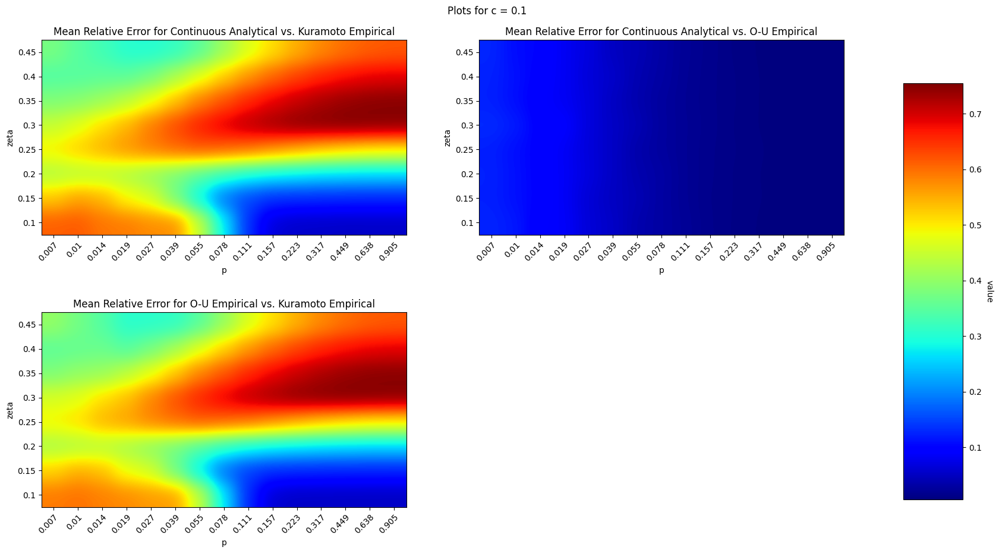

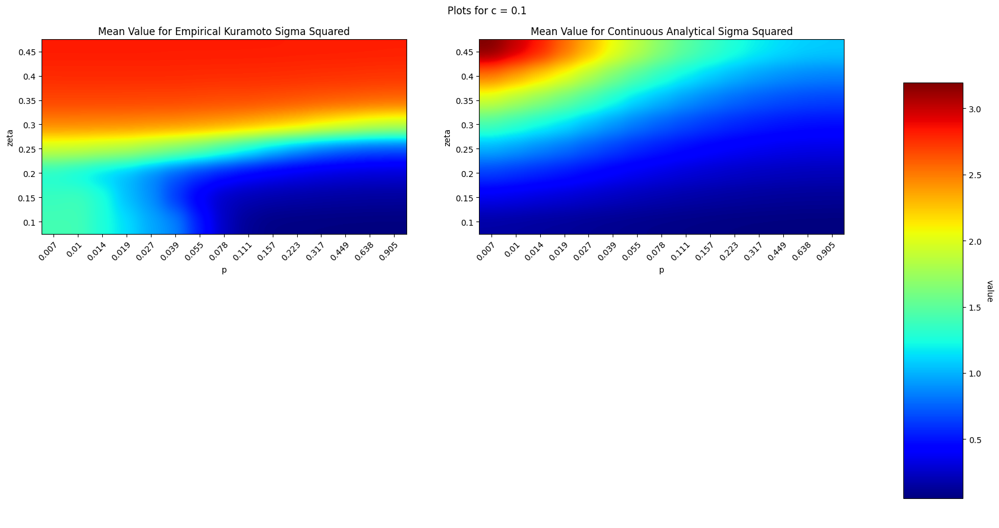

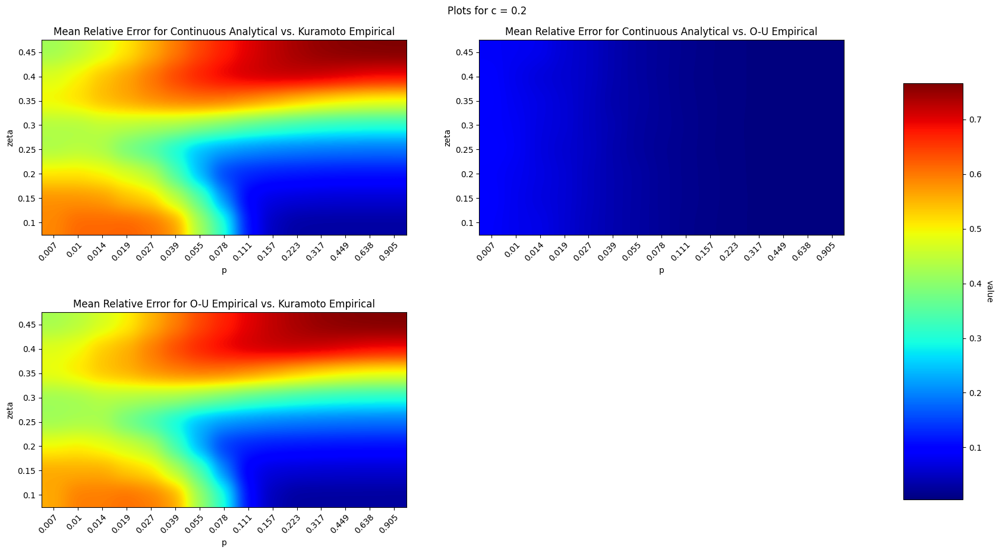

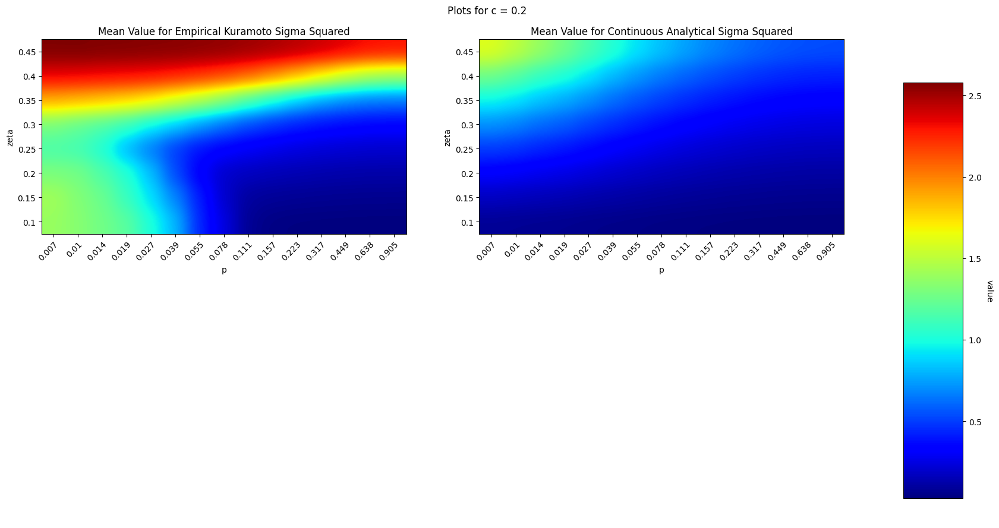

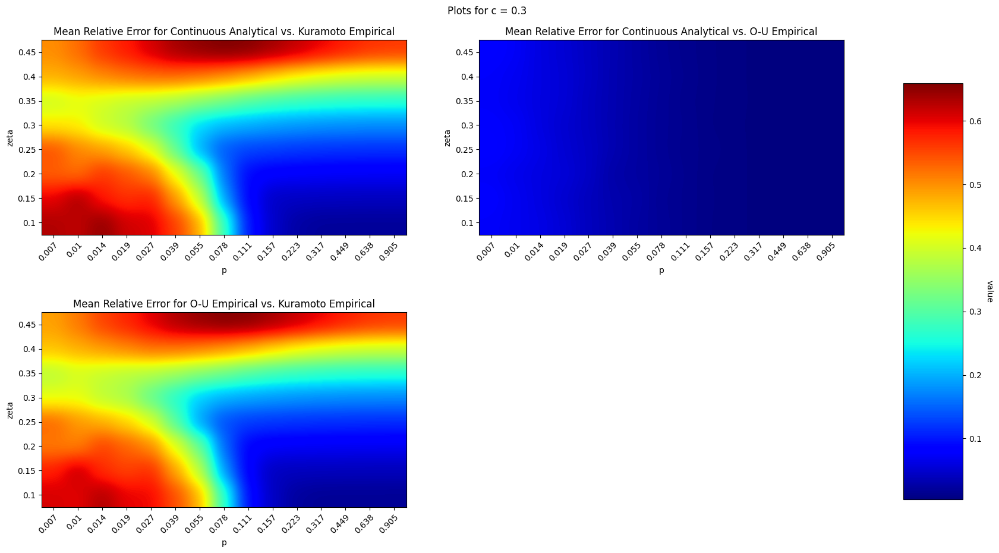

...

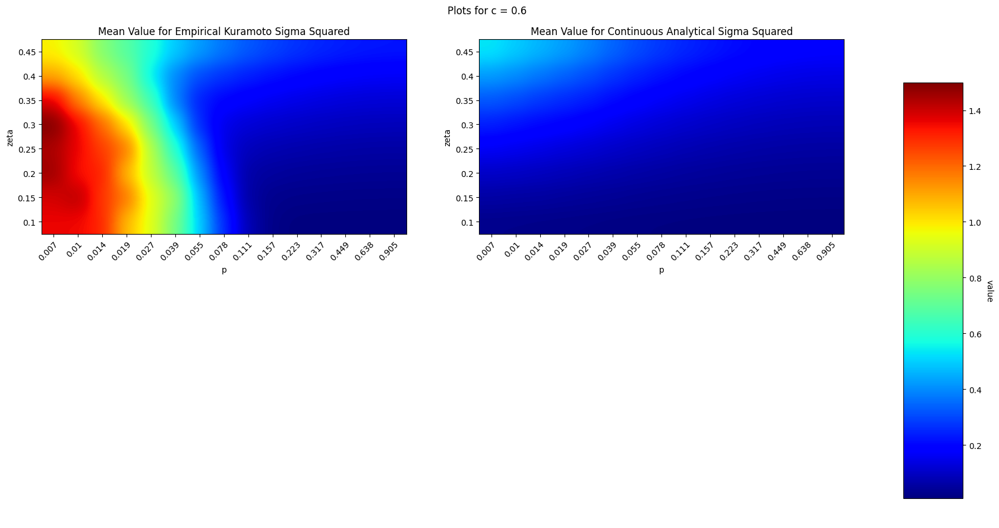

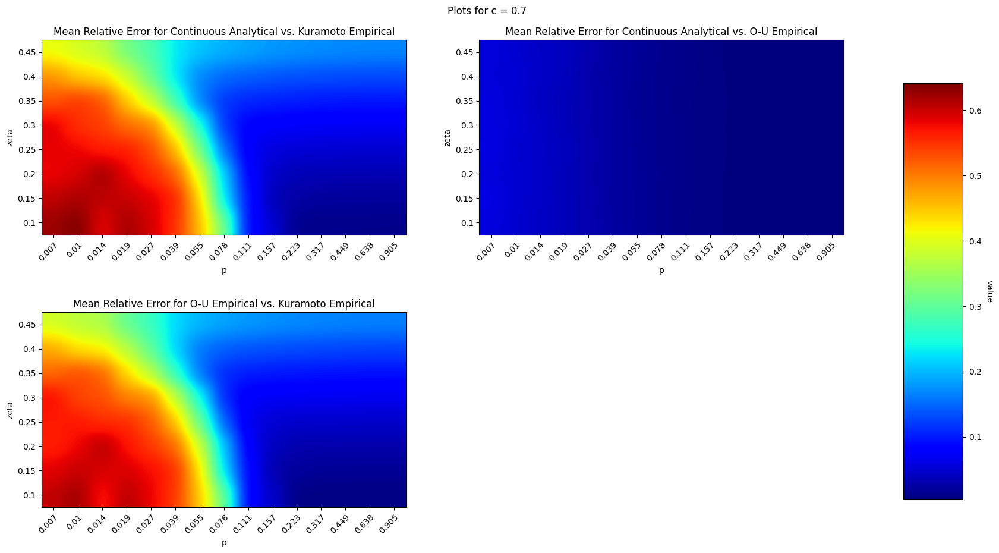

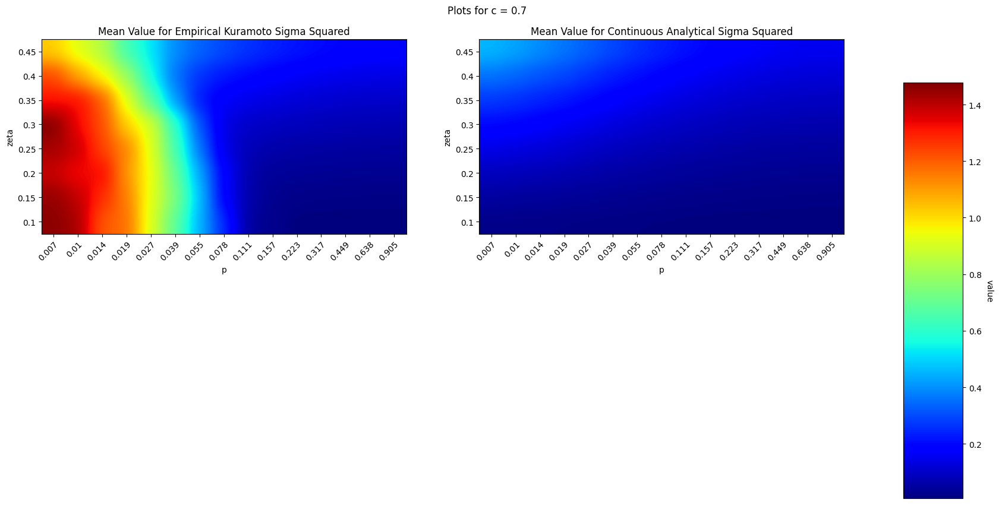

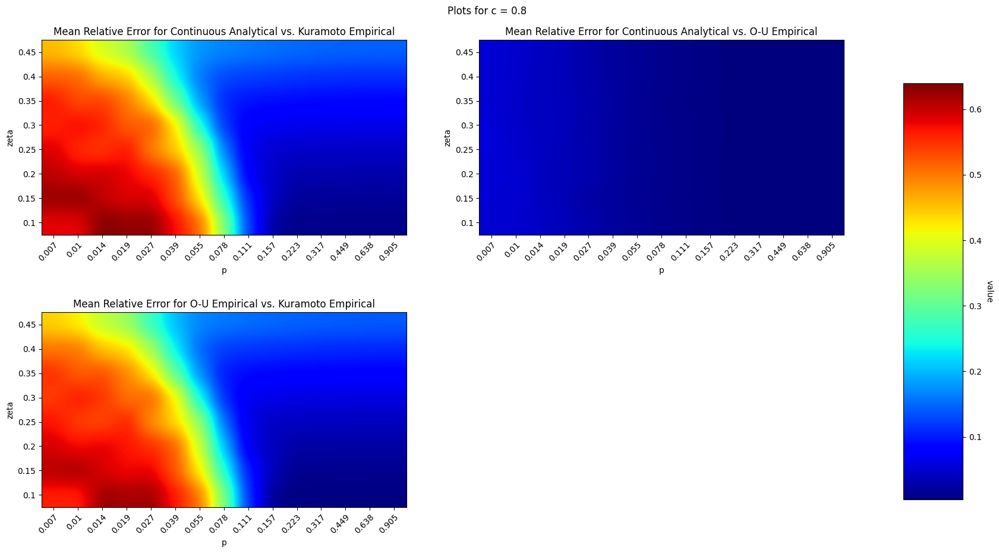

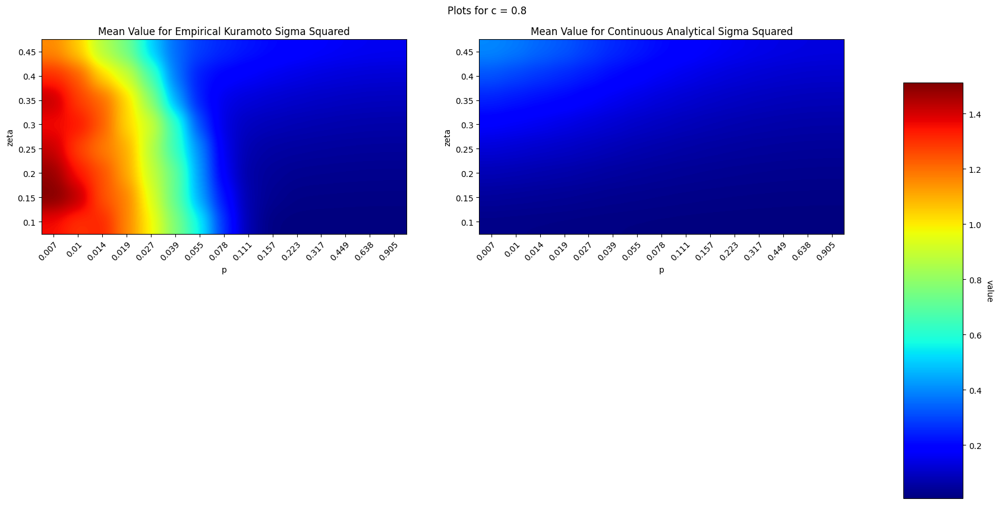

In [83]:
xyzplot("c", "p", "zeta")

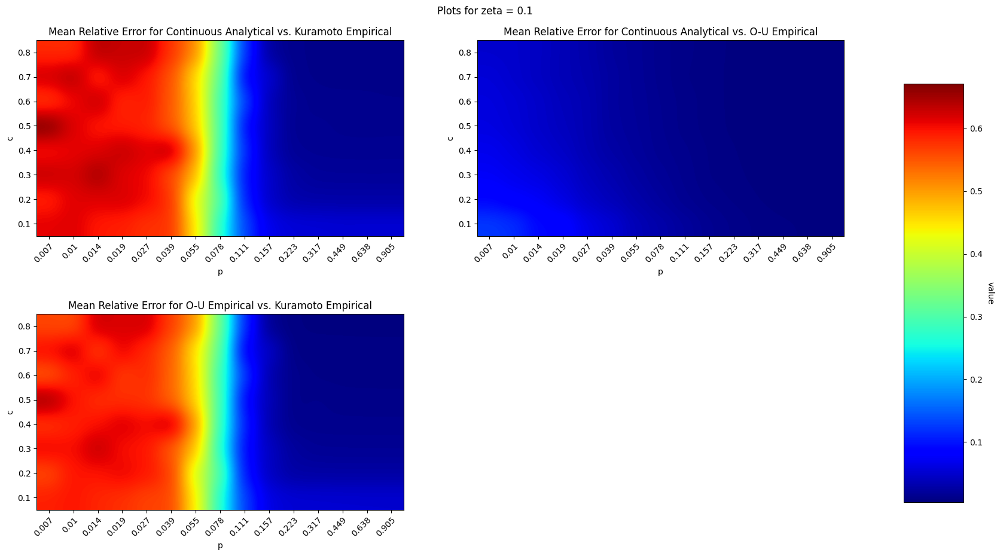

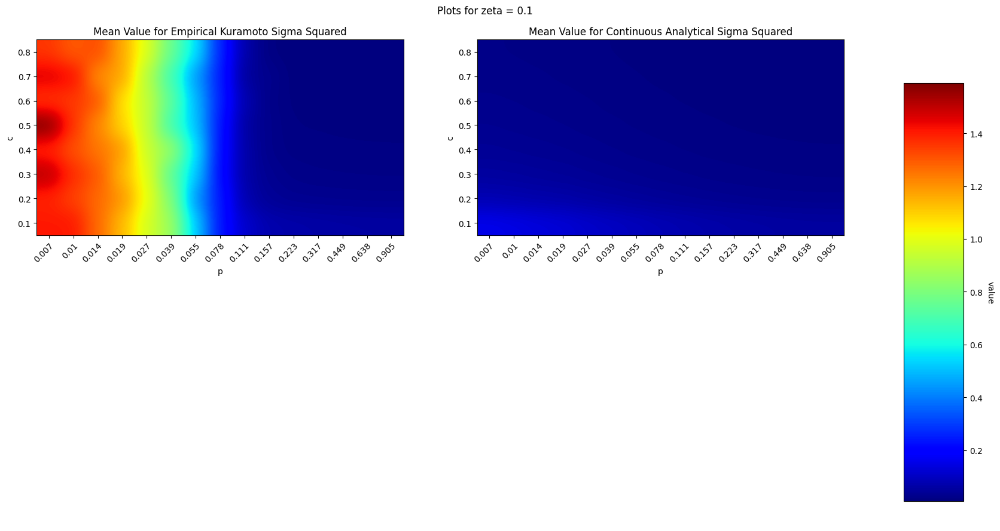

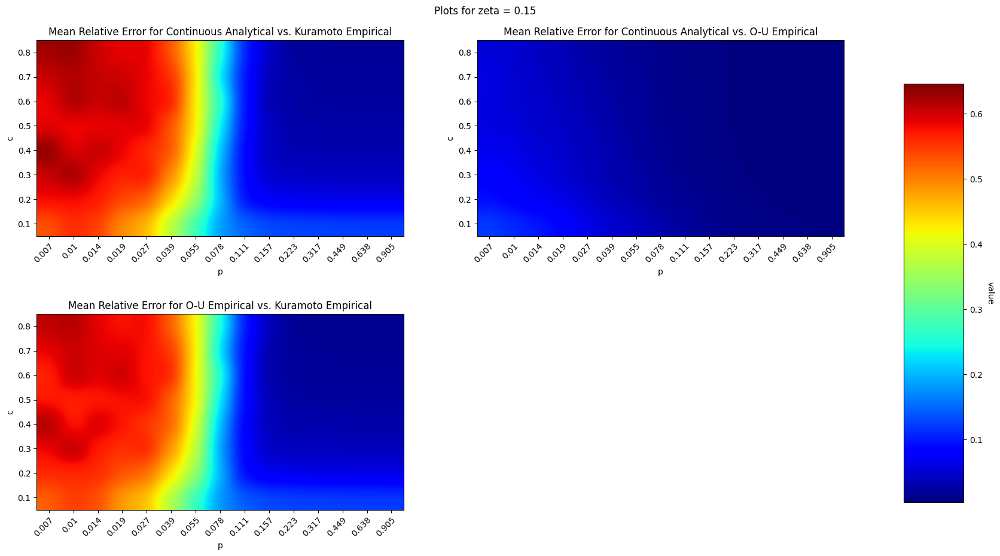

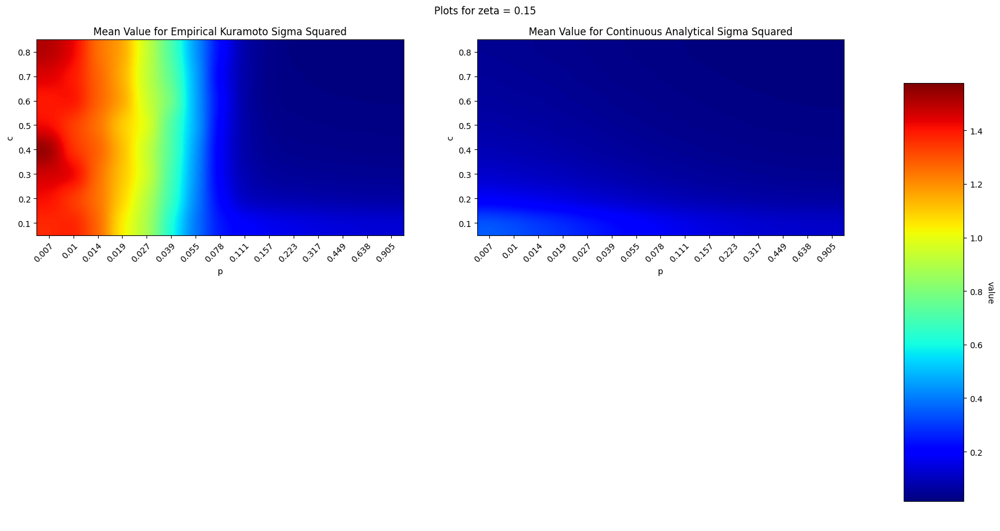

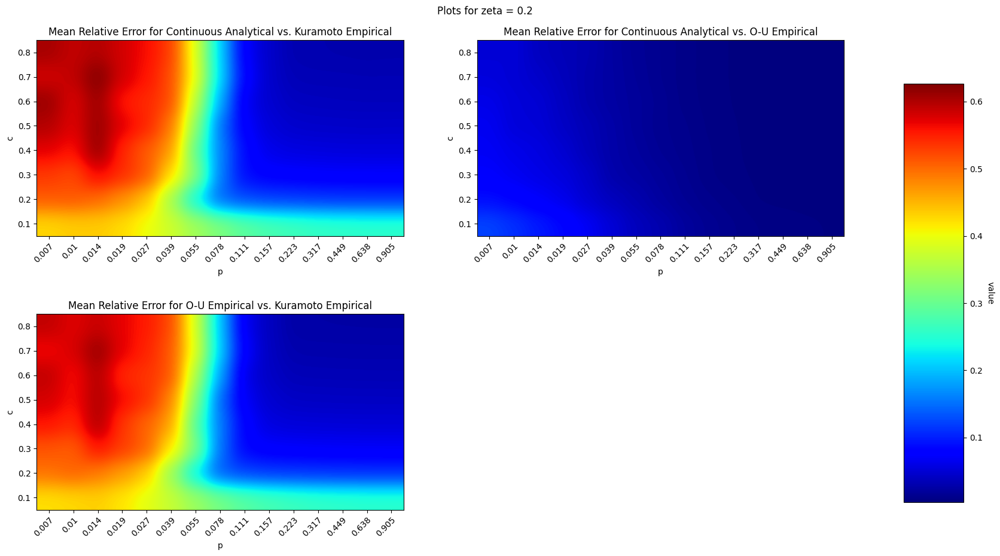

...

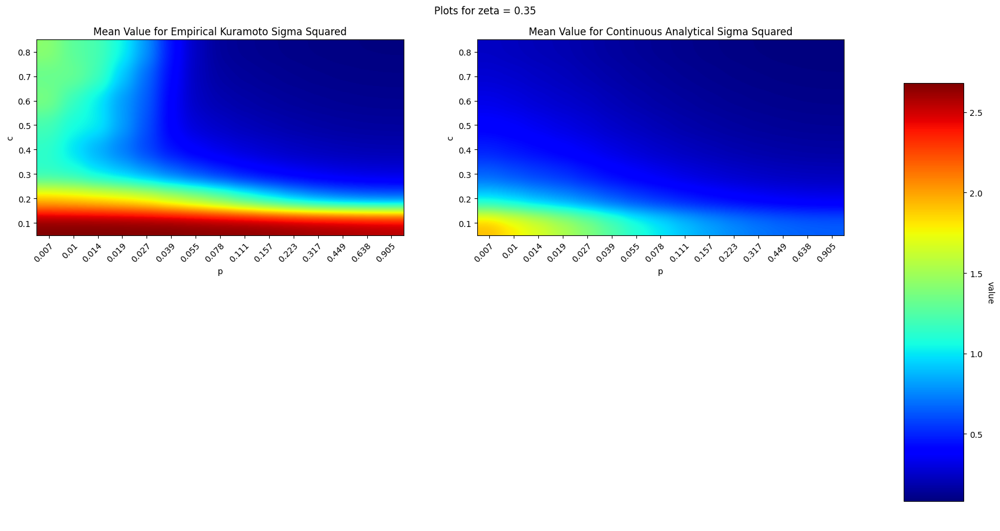

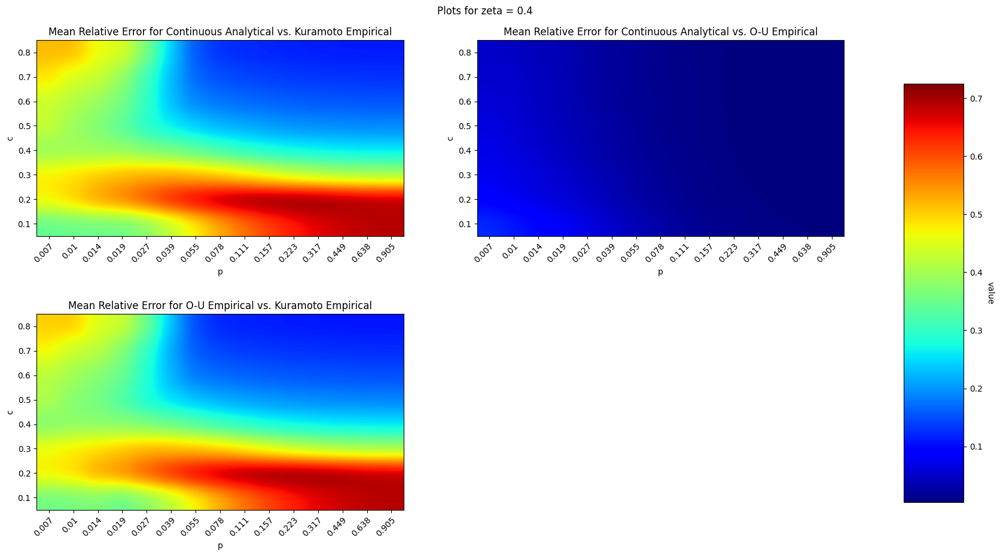

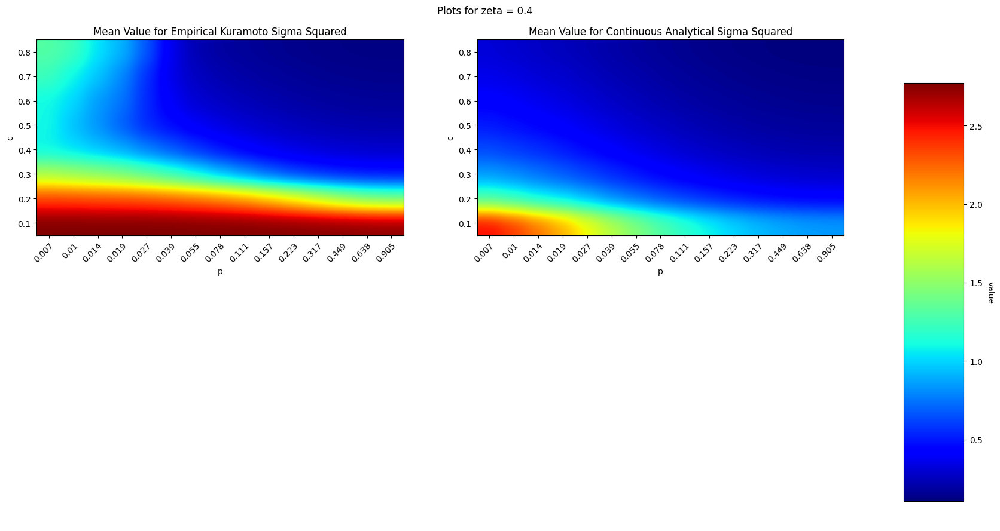

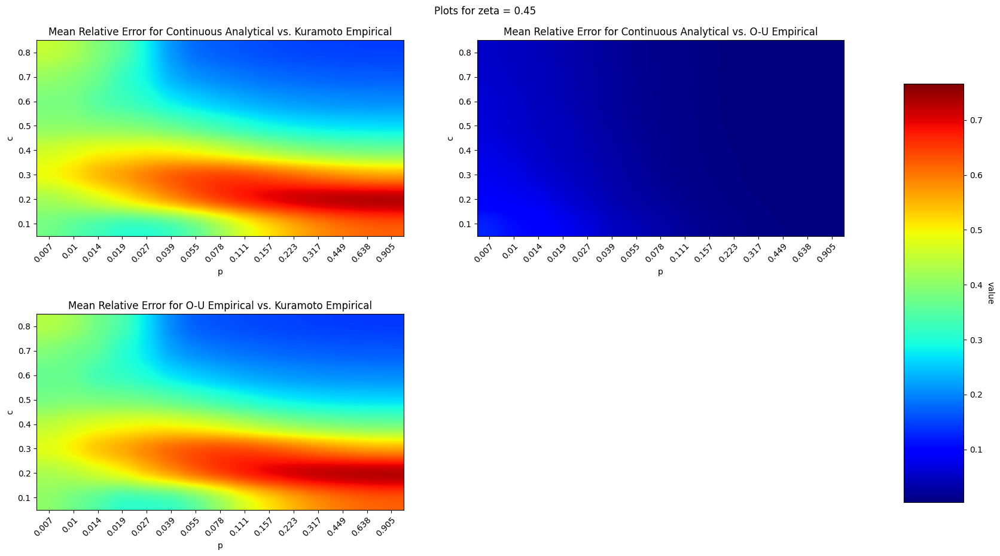

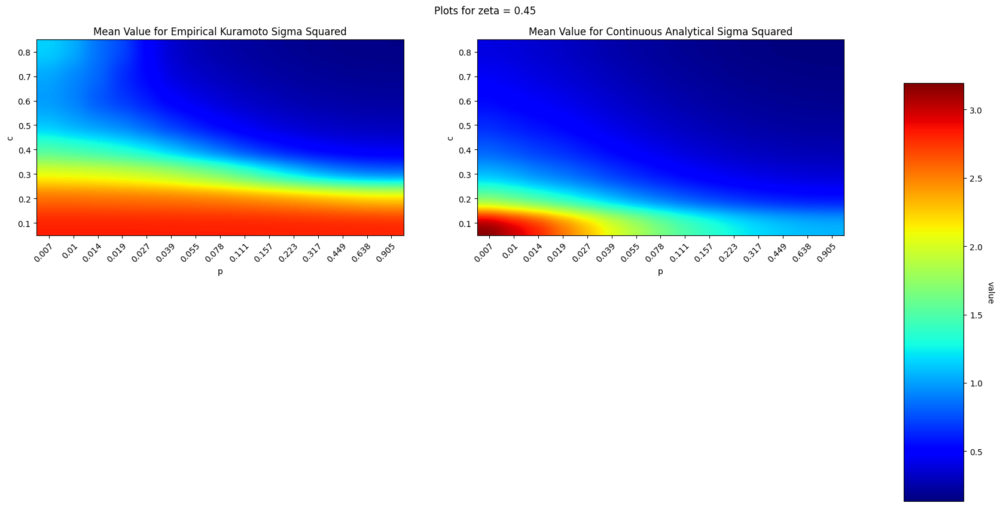

In [84]:
xyzplot("zeta", "p", "c")

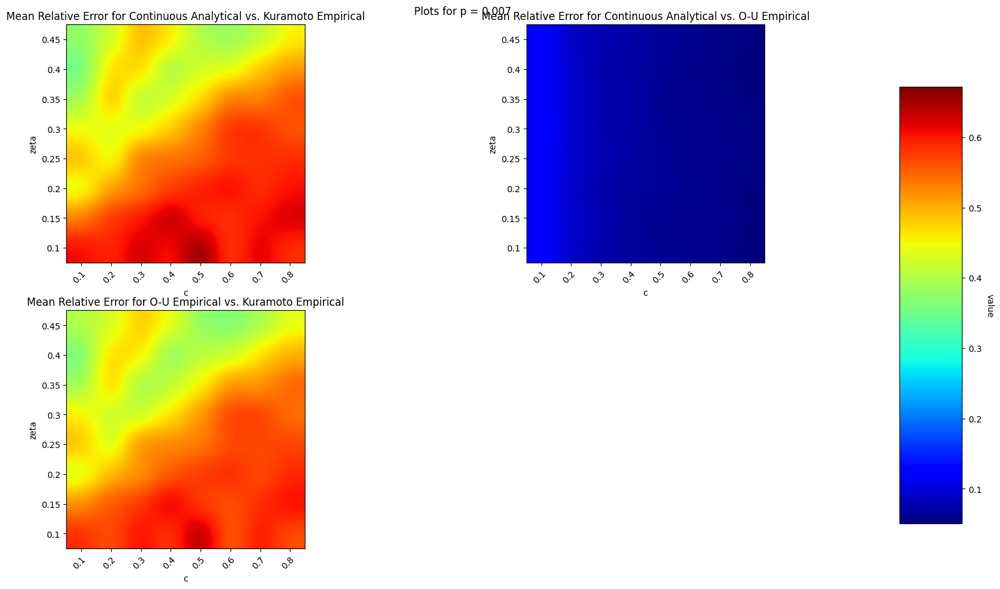

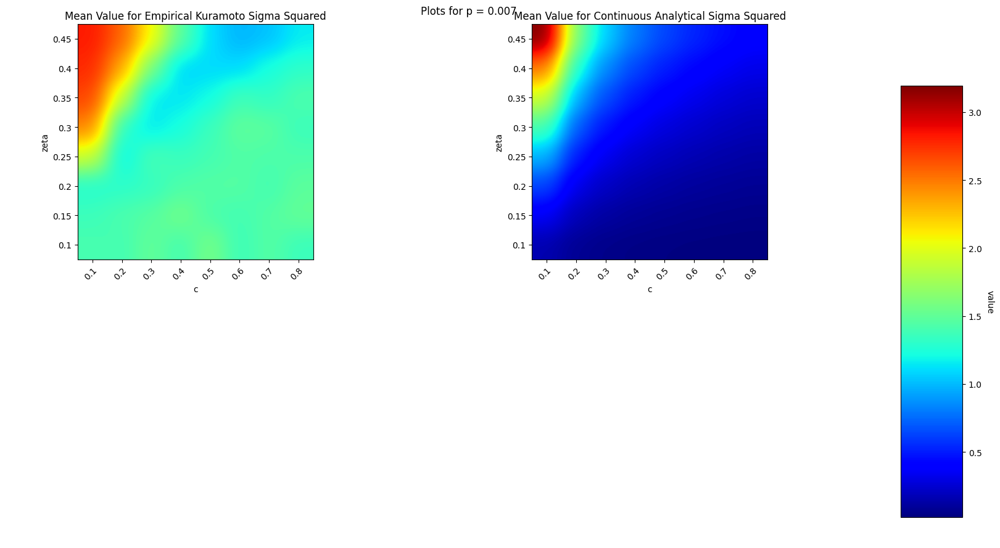

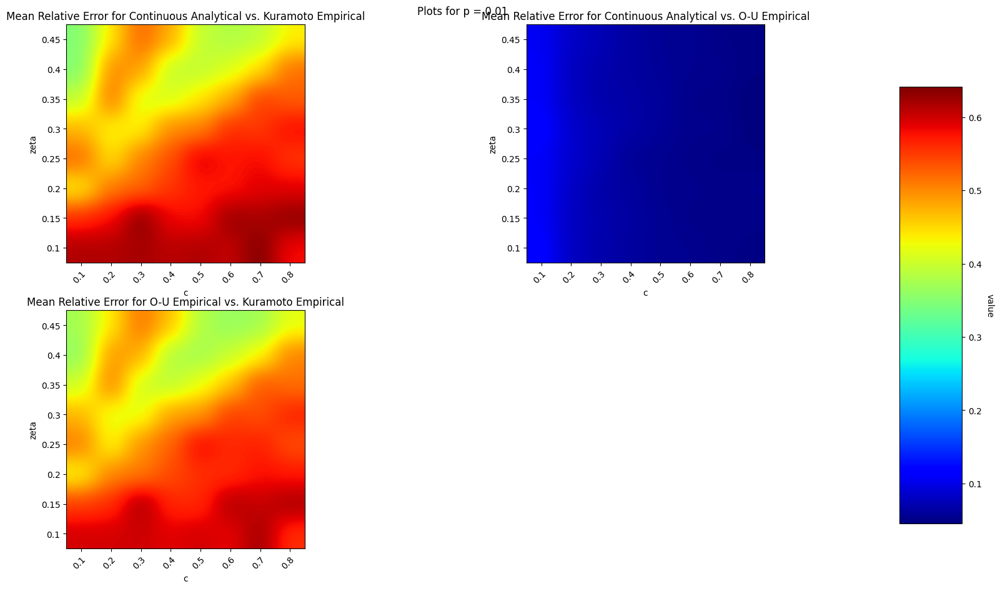

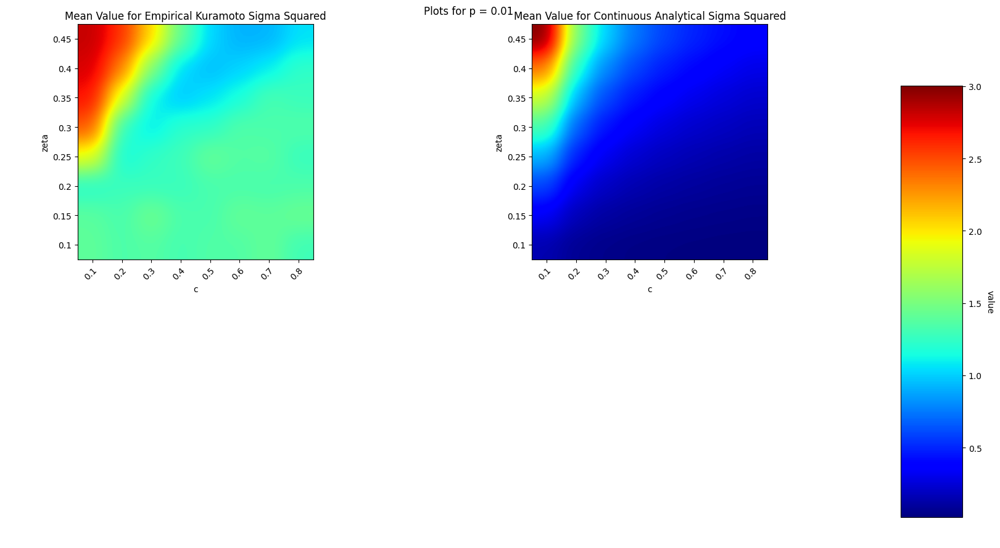

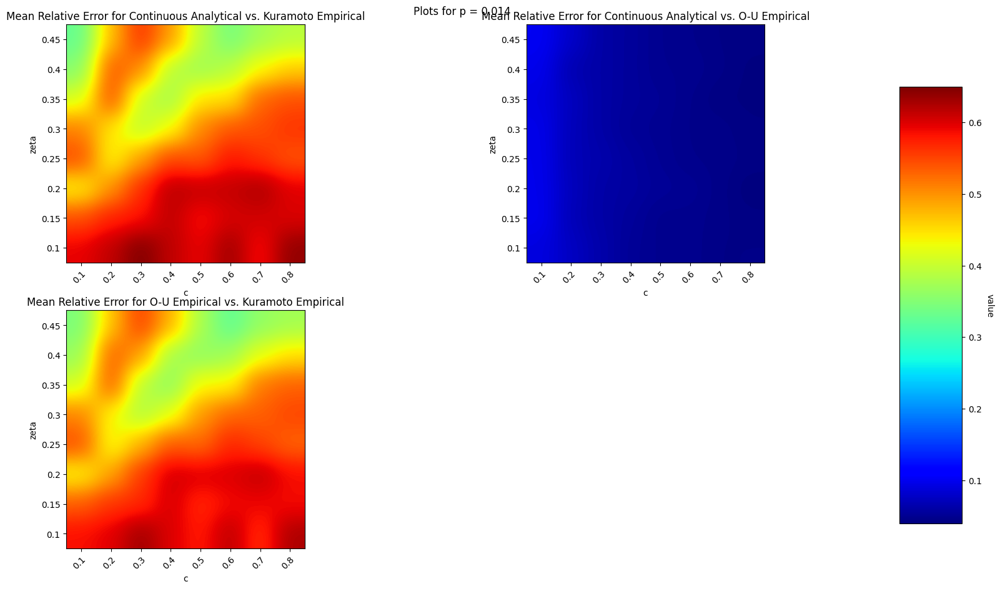

...

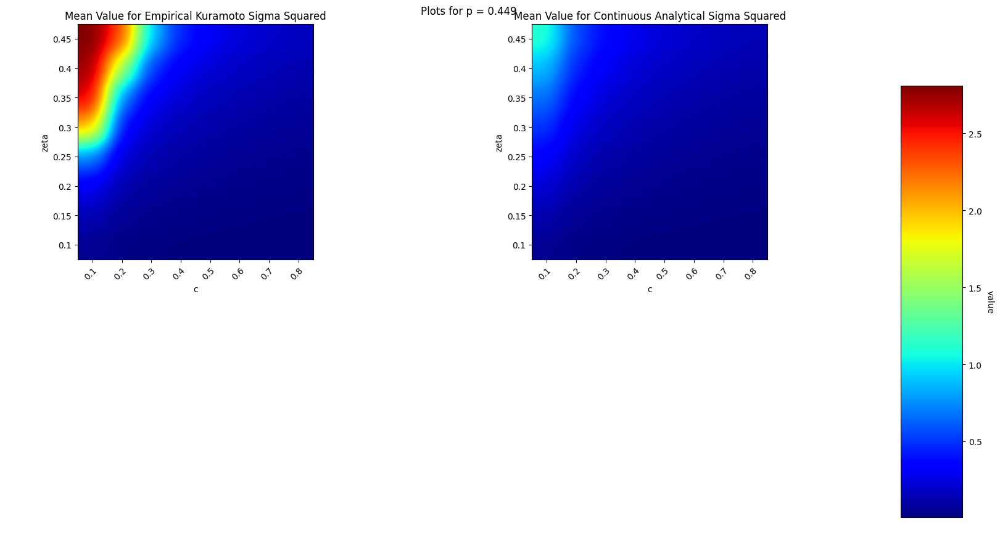

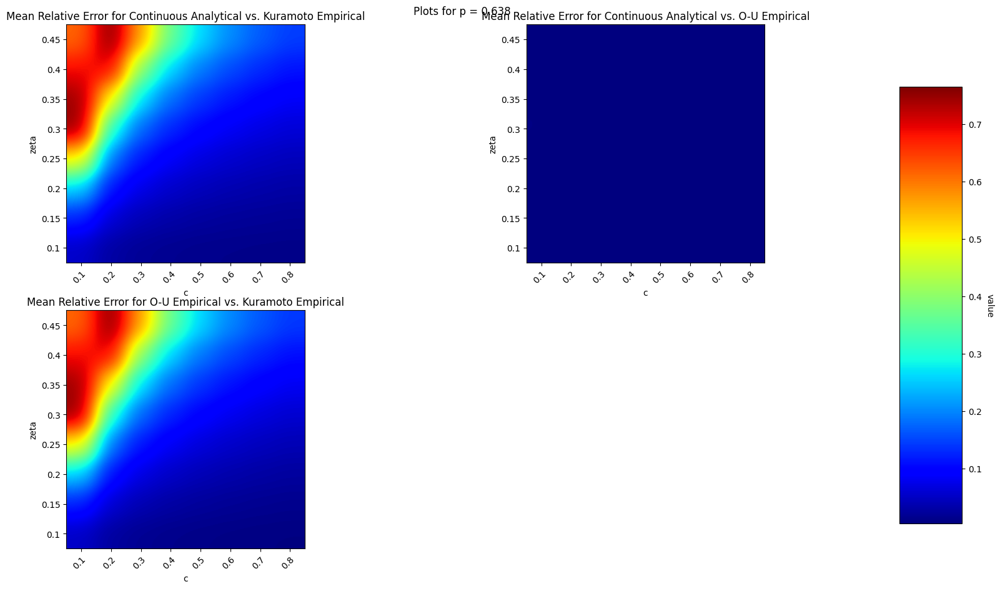

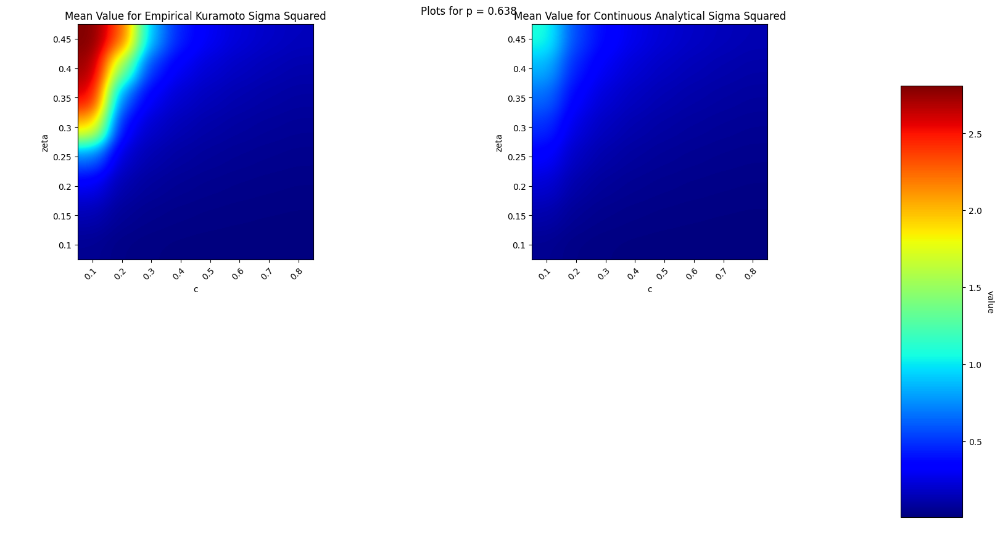

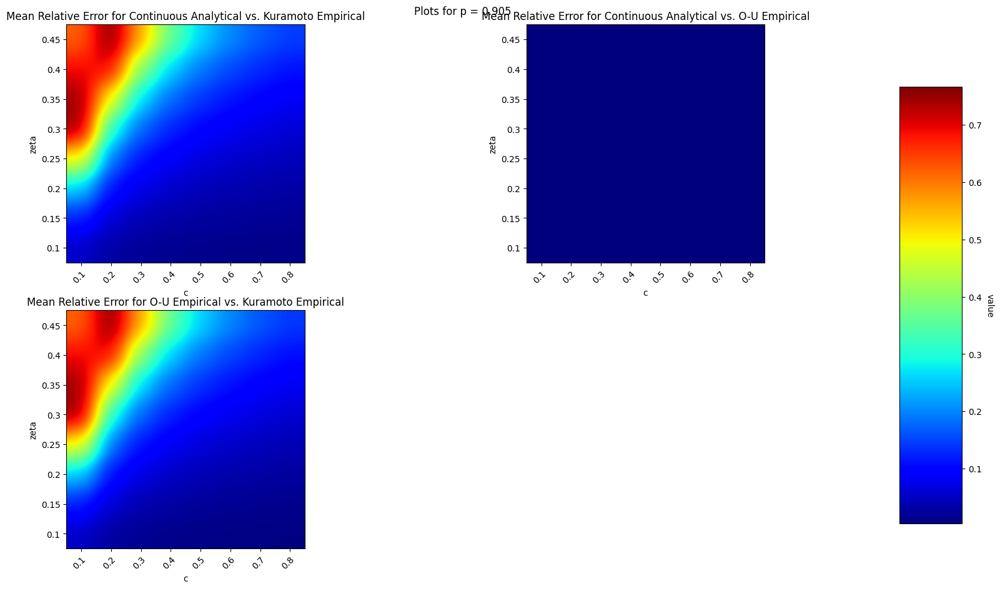

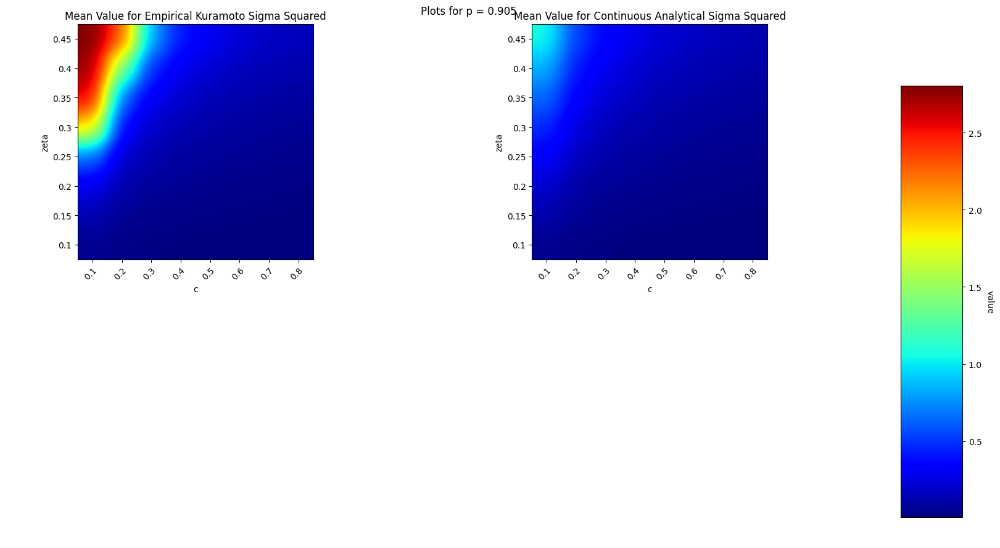

In [85]:
xyzplot("p", "c", "zeta")

In [91]:
num_list = ["10", "100", "1000", "all"]
folder = "data/processed/"
id_col = ("p", "zeta", "c")


data_list = map(lambda x: (gather_data(folder, x), x), num_list)
data_list = map(lambda x: (proc_data(x[0], id_col), x[1]), data_list)
data_list = map(lambda x: (x[0], 10000) if x[1] == "all" else (x[0], int(x[1])), data_list)
data_list = map(lambda x: (x[0], x[0].insert(0, "sample_count", [x[1]] * len(x[0])))[0], data_list)

multi_sample = pd.concat(data_list).reset_index(drop = True)


AttributeError: 'tuple' object has no attribute 'insert'

In [284]:
display(multi_sample.sample(10))

display(multi_sample.describe())

,sample_count,p,zeta,c,sigma_relative_error_continuous,sigma_relative_error_discrete,sigma_relative_error_discrete_approximation,empirical_relative_error_linear_kuramoto,discrete_approx_vs_continuous,discrete_vs_continuous,sigma_relative_error_continuous_kuramoto,sigma_relative_error_discrete_kuramoto,sigma_relative_error_discrete_approximation_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
3366,10000,0.078,0.30,0.7,0.011598,0.167999,0.010442,0.162932,0.004075,0.173183,0.166596,0.024331,0.163200,0.145927,0.175161
2269,1000,0.039,0.25,0.6,0.029009,0.236057,0.028696,0.076312,0.004857,0.242802,0.081224,0.141866,0.076759,0.076909,0.083837
857,10,0.638,0.25,0.2,0.161052,1.002288,0.162931,0.034669,0.004801,0.881463,0.154470,0.934999,0.155797,0.034755,0.035134
1528,100,0.111,0.45,0.1,0.064931,0.974754,0.065124,0.115257,0.005646,0.973277,0.121818,0.749022,0.118172,0.108737,0.123824
106,10,0.010,0.35,0.3,0.183387,0.598757,0.184367,0.084140,0.005597,0.547050,0.196334,0.480919,0.195739,0.086985,0.097692
1424,100,0.078,0.20,0.1,0.057228,0.953642,0.057968,0.020580,0.005778,0.952802,0.057330,0.913621,0.056991,0.021699,0.022262
1117,100,0.014,0.25,0.6,0.094527,0.271388,0.095488,0.073527,0.005531,0.239814,0.106074,0.192314,0.104446,0.077580,0.083245
2743,1000,0.449,0.40,0.8,0.030464,0.119514,0.030478,0.585500,0.002615,0.122728,0.586242,0.535483,0.585158,0.360714,0.883147
1828,100,0.638,0.30,0.5,0.068707,0.409026,0.069016,0.085815,0.003540,0.397647,0.098116,0.289381,0.096496,0.080092,0.087609
799,10,0.449,0.25,0.8,0.355039,0.448242,0.356652,0.134635,0.002596,0.122620,0.344417,0.397732,0.345289,0.141182,0.155766


,sample_count,p,zeta,c,sigma_relative_error_continuous,sigma_relative_error_discrete,sigma_relative_error_discrete_approximation,empirical_relative_error_linear_kuramoto,discrete_approx_vs_continuous,discrete_vs_continuous,sigma_relative_error_continuous_kuramoto,sigma_relative_error_discrete_kuramoto,sigma_relative_error_discrete_approximation_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
count,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000,3840.000000
mean,2777.500000,0.203267,0.275000,0.450000,0.083674,0.496276,0.083964,0.117742,0.004747,0.463568,0.160594,0.436506,0.158464,0.097012,0.153722
std,4188.387176,0.259156,0.114579,0.229159,0.088250,0.280995,0.089139,0.131549,0.000965,0.289734,0.128190,0.267216,0.128966,0.095360,0.216907
min,10.000000,0.007000,0.100000,0.100000,0.005444,0.096533,0.004424,0.004710,0.002398,0.106152,0.009637,0.012913,0.006101,0.004899,0.004894
25%,77.500000,0.019000,0.187500,0.275000,0.015017,0.266212,0.014820,0.035194,0.004074,0.230479,0.066639,0.224766,0.063526,0.027521,0.041595
50%,550.000000,0.078000,0.275000,0.450000,0.044598,0.431458,0.044179,0.072179,0.004909,0.412239,0.120589,0.390877,0.116685,0.067575,0.084737
75%,3250.000000,0.317000,0.362500,0.625000,0.138524,0.696637,0.139411,0.139915,0.005491,0.695982,0.216137,0.602641,0.216761,0.132220,0.165440
max,10000.000000,0.905000,0.450000,0.800000,0.408391,1.357257,0.411293,0.630956,0.006779,1.190836,0.631709,1.296039,0.630744,0.503923,1.455810


In [285]:
sc = multi_sample["sample_count"].unique()
id_cols = ["p", "zeta", "c"]

csamp = multi_sample.groupby(id_cols).sum()
csamp = csamp.filter(id_cols)

for s in sc:
    sample = multi_sample[multi_sample["sample_count"] == s]
    sample = sample.filter([*id_cols, "sigma_relative_error_continuous", "sigma_relative_error_continuous_kuramoto"])
    sample = sample.rename(columns={"sigma_relative_error_continuous": "error_sample_" + str(s)})
    sample = sample.rename(columns={"sigma_relative_error_continuous_kuramoto": "error_kuramoto_sample_" + str(s)})
    sample = sample.set_index(id_cols)
    csamp = csamp.join(sample)

csamp = csamp.reset_index(drop=False)

display(csamp)

,p,zeta,c,error_sample_10,error_kuramoto_sample_10,error_sample_100,error_kuramoto_sample_100,error_sample_1000,error_kuramoto_sample_1000,error_sample_10000,error_kuramoto_sample_10000
0,0.007,0.10,0.1,0.161191,0.222426,0.063650,0.129410,0.021629,0.090591,0.008469,0.081029
1,0.007,0.10,0.2,0.203350,0.238873,0.062185,0.100378,0.023179,0.063609,0.009513,0.052847
2,0.007,0.10,0.3,0.192494,0.231471,0.062862,0.110631,0.023862,0.074407,0.008874,0.061966
3,0.007,0.10,0.4,0.237522,0.272589,0.074220,0.115630,0.024006,0.066395,0.009263,0.056960
4,0.007,0.10,0.5,0.246410,0.278396,0.091573,0.126490,0.026122,0.066808,0.010344,0.056174
...,...,...,...,...,...,...,...,...,...,...,...
955,0.905,0.45,0.4,0.167105,0.220928,0.052554,0.192999,0.018911,0.191983,0.006344,0.190108
956,0.905,0.45,0.5,0.172570,0.271692,0.071105,0.233736,0.021015,0.243666,0.008512,0.248006
957,0.905,0.45,0.6,0.196853,0.262610,0.069342,0.324290,0.022337,0.339514,0.007289,0.350586
958,0.905,0.45,0.7,0.204184,0.415491,0.085136,0.468510,0.023939,0.516705,0.009295,0.522483


In [88]:
import matplotlib.pyplot as plt

#df should be prepivoted and filtered
def graph_diff(df, plt_name, splt_name_func, err_data_names, min_max = None, nfi = None, col_ind = ("x", "y"), size = (5, 2)):
    err_data_names = df.columns.get_level_values(0)
    fig, axes = plt.subplots(nrows=size[0], ncols=size[1])
    fig.suptitle(plt_name)
    
    fig.set_size_inches(25, 30)
    fig.subplots_adjust(top=0.95)
    
    if min_max is None:
        cmax = df.max().max()
        cmin = df.min().min()
    else:
        cmax = min_max[1]
        cmin = min_max[0]

    for name_index in range(len(axes.flat)):
        if name_index >= len(err_data_names):
            ax = axes.flat[name_index]
            ax.axis('off')
            continue
        if nfi is not None:
            name = list(nfi.keys())[name_index]
        else:
            name = list(set(err_data_names) - set(col_ind))[name_index]
        df_p = df[name]
        #display(df_p)
        np_a = df_p.to_numpy()
        ax = axes.flat[name_index]

        x_t = df_p.columns.to_numpy()
        y_t = df_p.index.to_numpy()
        ax.set_xticks(np.arange(0, len(x_t)), labels=x_t)
        ax.set_yticks(np.arange(0, len(y_t)), labels=y_t)

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
            rotation_mode="anchor")
        ax.set_title(splt_name_func(name))
        ax.set_ylabel(df_p.index.names[0])
        ax.set_xlabel(df_p.columns.names[0])

        im = ax.imshow(np_a,interpolation="gaussian", cmap="jet", vmin=cmin, vmax=cmax)
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax, fraction=0.046, pad=0.04, shrink = 0.7)
    cbar.ax.set_ylabel("value", rotation=-90, va="bottom")

    plt.show()
    print("\n" * 10)

In [89]:
NAME_FUNC = lambda x: str(x)

def xyzplot2(data, var, col, ind):
    for v in data[var].unique():
        df_test = data[data[var] == v].drop(var, axis=1).pivot(columns=col, index=ind)
        df_test = df_test.sort_index(ascending=False)
        df_test = df_test.reindex(sorted(df_test.columns), axis=1)
        #display(df_test)
        graph_diff(df_test, "Plots for " + var + " = "+str(v), NAME_FUNC, df_test.columns, col_ind = (col, ind), size = (4,2))

In [90]:
xyzplot2(csamp, "p", "c", "zeta")

NameError: name 'csamp' is not defined